# A closer look into the resolutions of the World Health Assembly

## Introduction

In general, WHA is held once every year in May, with the first session
being held in 1948 and the 75th session in 2022. Each WHA resolutions is
identified by a unique ID of the form `WHA{X}.{Y}` where `X` is the
session number and `Y` the resolution number in that session. For
example, `WHA75.3` corresponds to the 3rd resolution from the 75th
session. Each resolution concerns a specific topic, and contains many
“clauses” that recognize and acknowledge identified problems, issues and
concerns, and suggest, recommend, direct various countries, organization
and bodies both within and outside the World Health Organization (WHO)
to work towards solutions. For example, these are the first few clauses
of WHA73.1 from 2020’s session, titled “COVID-19 response”.

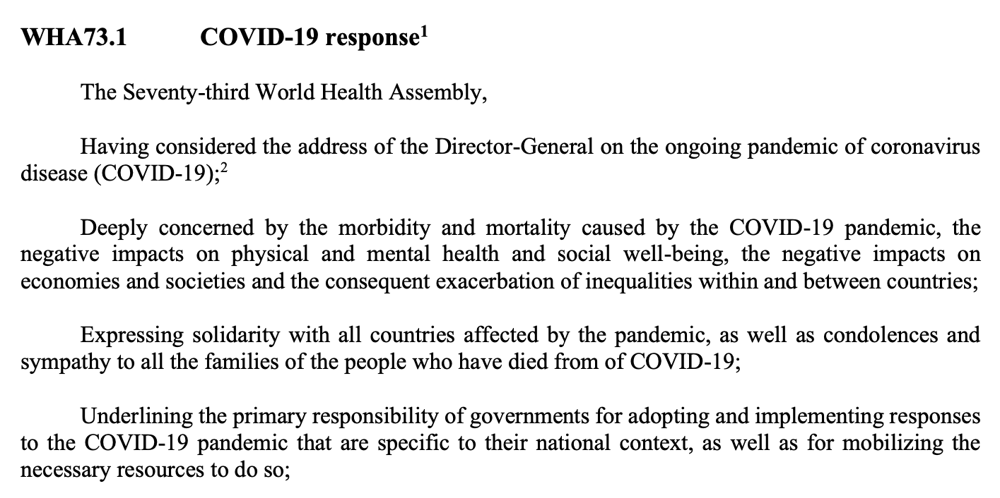

In this project, I sought to

1.  create a dataset of WHA resolutions over the years,
2.  identify topics covered by WHA resolutions over the years, and track
    their evolution,
3.  uncover relationships between WHA resolutions and visualize them,
4.  analyze how different countries have contributed to WHO’s budget
    over the years, and
5.  identify new questions of interest concerning this dataset and other
    related issues to take up as future projects.

## Create a dataset of WHA resolutions

To create a clean dataset of WHA resolutions, I followed these general
steps:

1.  I first obtained the PDF files containing the resolutions from all
    the WHA sessions so far from the WHO [website](https://www.who.int).
    I also obtained the titles of these resolutions.  
2.  Using the package `PyPDF2`, I extracted text from these PDF files
    and created one text file per resolution.
3.  For the above two steps, all resolutions till 2019 have one PDF file
    per resolution, but 2020-2022 have one PDF file containing all the
    resolutions. So, to extract one text file per resolution for
    2020-2022 as well, and to clean up the text files (get rid of extra
    spaces, unwatned special characters, headers and footers that are
    part of scanned PDFs from some years and have been unwantedly
    retained in the text files, and references of the form
    `COVID-19 response1` from WHA73.1’s title), we run a script that
    cleans the text files and stores one text file per resolution.

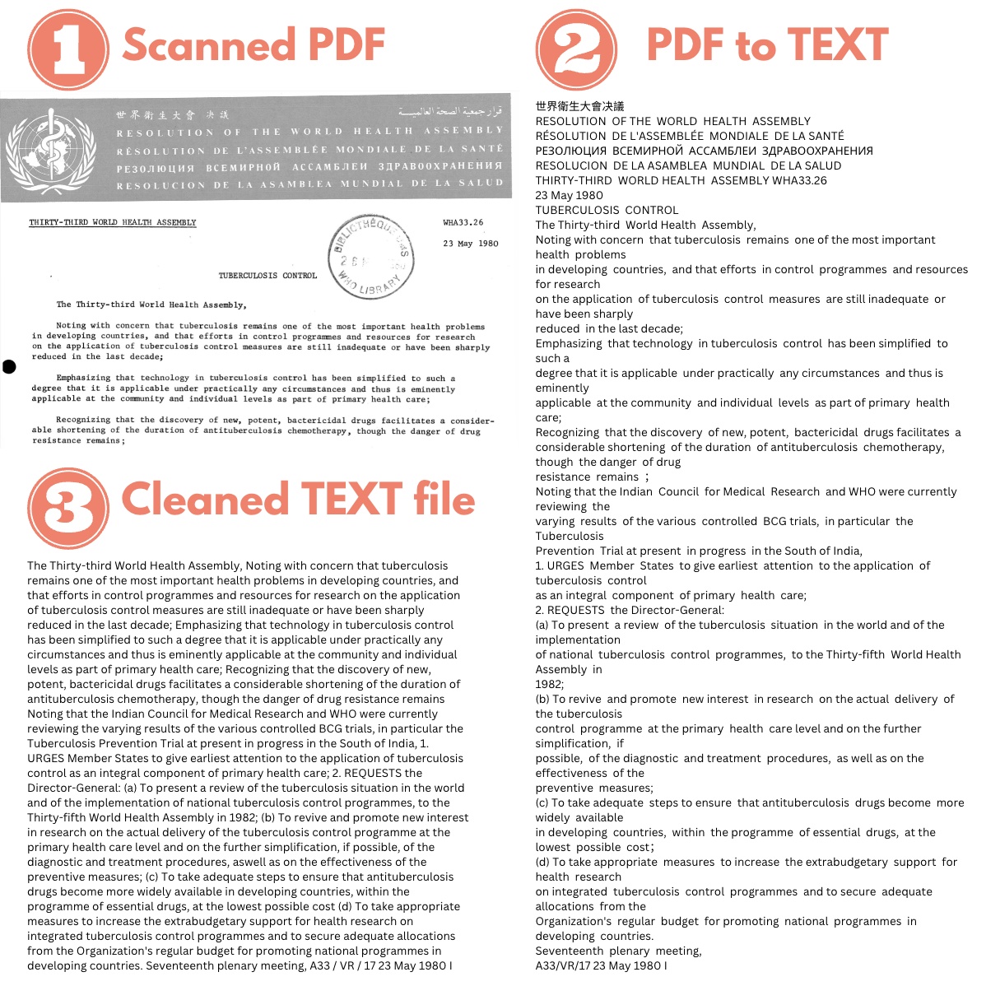

Having done these steps, we end up with a list of text files (one per
resolution) for each WHA session. We can read these into Python, and see
all the information (resolution number of the form `WHA{X}.{Y}`, title
of the resolution, year of the session and the clean text of the
resolution) of all the

,number,title,year,text
0,WHA1.10,Regarding the instruction in statistics in med...,1948,s WHEREAS satisfactory health statistics are d...
1,WHA1.2,Resolution 2: regarding the use of the Interna...,1948,WHEREAS it is essential that the International...
2,WHA1.3,Resolution 3: regarding the use of lists of se...,1948,WHEREAS this Conference has adopted for the Si...
3,WHA1.1,Resolution 1: regarding adoption of the Intern...,1948,WHEREAS in recognition of the general trend of...
4,WHA1.4,Resolution 4: regarding the preparation of a l...,1948,REAS the Intermediate List of 150 causes does ...
...,...,...,...,...
3157,WHA75.16,Agreement between the World Health Organizatio...,2022,Having considered the report on the proposed a...
3158,WHA75.17,Human resources for health,2022,Having considered the report by the Director-G...
3159,WHA75.18,Outcome of the SIDS Summit for Health: For a H...,2022,Having considered the consolidated report by t...
3160,WHA75.19,Well-being and health promotion,2022,Having considered the consolidated report by t...


Note that some of the words in the first session’s resolutions have been
cut off at the beginning. There are indeed a few other resolutions where
such unwanted errors and typos are present. A common type of typo is a
missing space between words. However, these aren’t very common, so I
leave them as they are.

## First look at topics and their time evolution

To get a taste of the topics of WHA resolutions and their evolution over
time, I chose a few topics of interest like “Sustainability”, “HIV”,
“Climate Change”, “COVID-19” etc. and checked how often short phrases
related to each of these topics is present in resolutions from different
years.

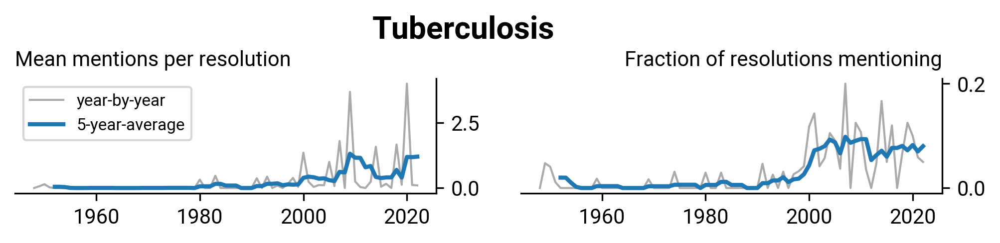

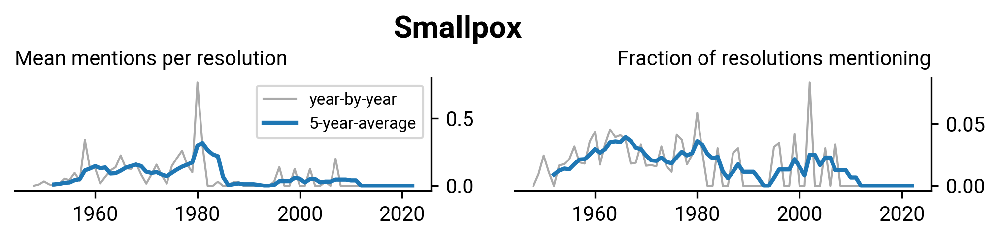

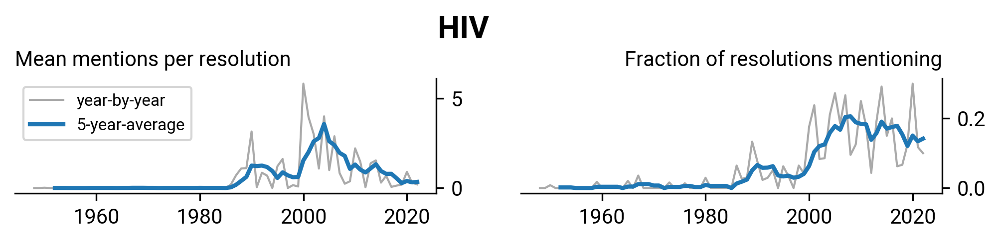

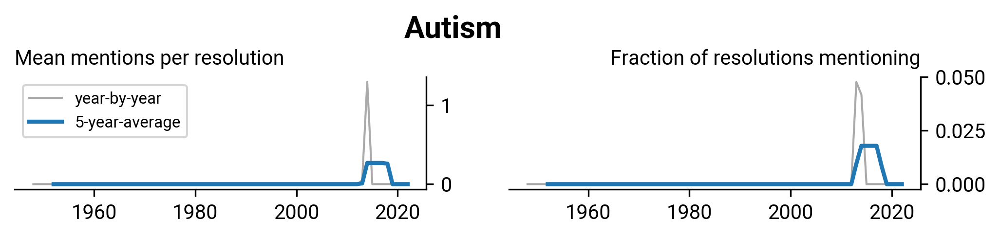

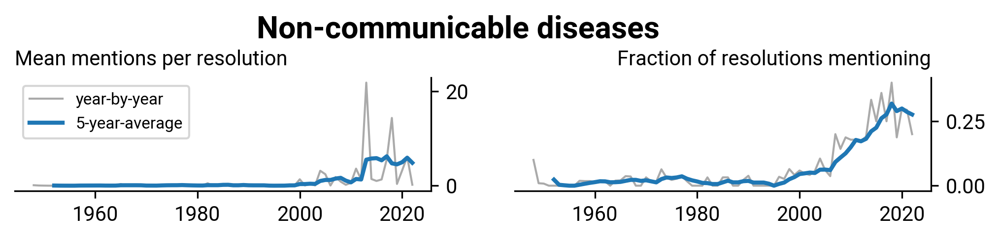

...

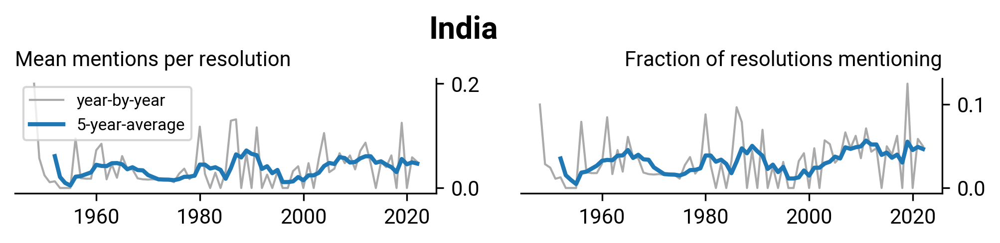

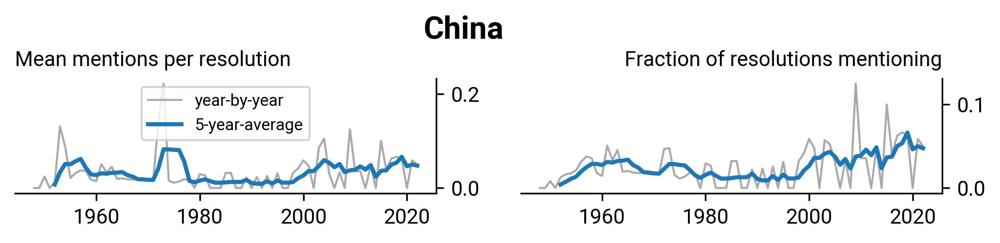

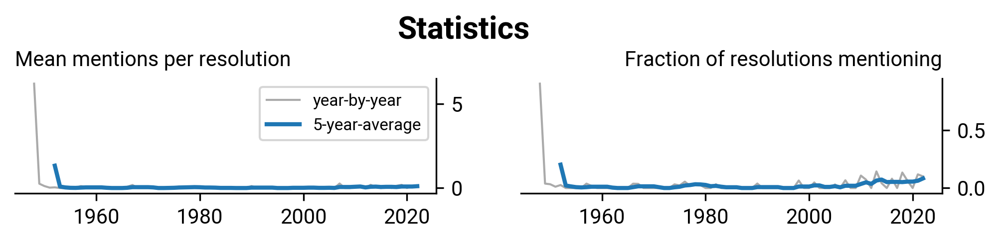

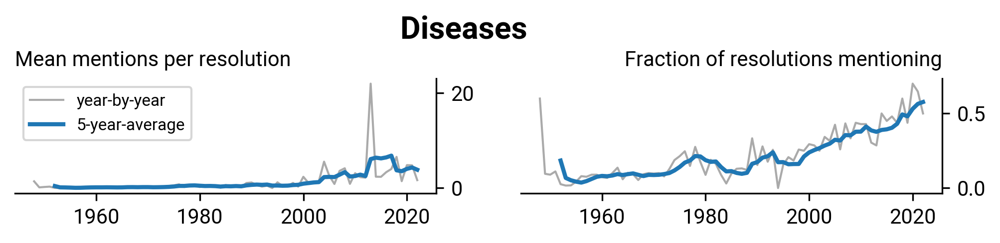

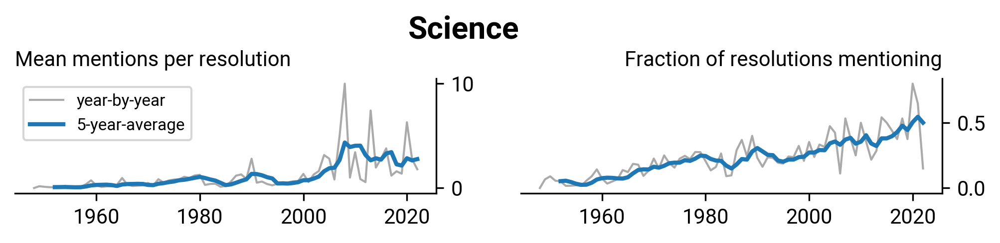

## Identification of topics and grouping by their time evolution

To uncover more topics covered by WHA resolutions, and use them to find
relationships between WHA resolutions, I looked towards natural language
processing and network analysis. I used TF-IDF vectorization to find
keywords/topics for each resolution and built a network of WHA
resolutions by comparing these identified keyword lists.

I won’t go into many details behind the natural language processing
pipeline and will only briefly summarize it. Each resolution is
associated with two strings - `title` and `text`. For both of these
strings, we perform usual NLP pre-processing steps like tokenization,
removal of stop words, and additional text cleaning like removing
special characters and numbers. Then, we also stemmize all the tokens
(words) in these strings so that different words like “sustainability”,
“sustainable”, “sustain”, “sustains”, “sustaining”, “sustained” are all
reduced to a common form “sustain”. This collection of cleaned and
stemmized documents (each resolution is a document) is called a corpus.
We have two stemmized corpuses - `corpus_title` and `corpus_text`. For
the following explanation, I’ll refer to `corpus_text` as the corpus,
and we’ll only be using `corpus_text` in this study.

So, the corpus is a collection of documents (resolutions), and each
document is a collection of words (after having removed special
characters, numbers and stop words which are commonly occuring English
words like “the”, “a” etc.). For each word in the corpus, we can
calculate its `document frequency`, which is the fraction of documents
containing the word. For each pair of word and document, we can also
calculate the `TF-IDF score`, a score that is a combination of term
frequency and inverse document frequency. What is important to note is
that TF-IDF score is intended to reflect how important a word is to a
document.

First, we’ll check these two values for all the words in the corpus, and
also check how the vocabulary size (no. of words) changes as we modify
the minimum document frequency and maximum document frequency allowed.

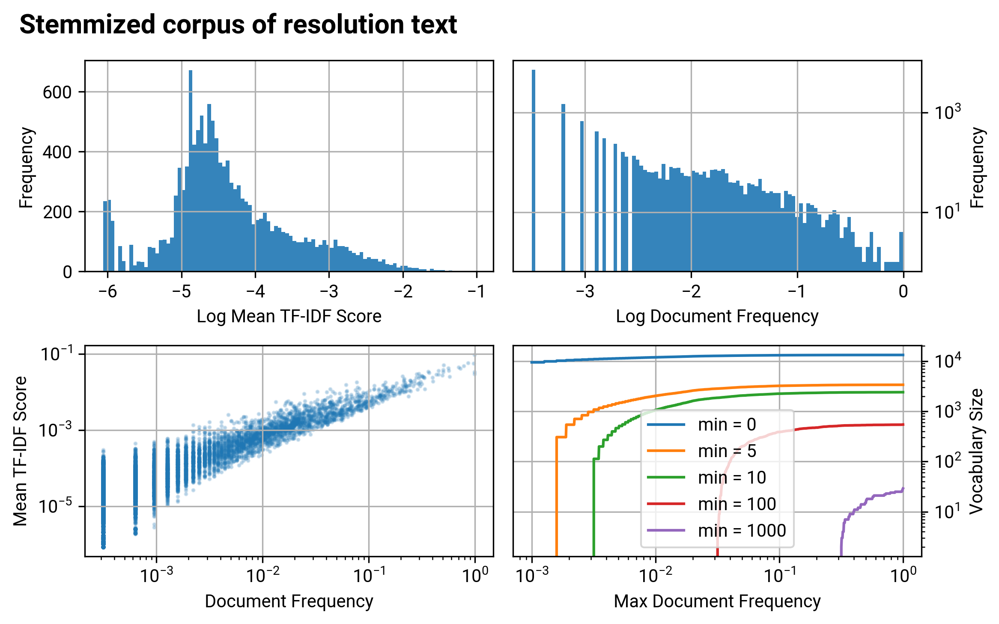

Words with a very high document frequency are probably those that aren’t
very relevant to the specific topic of the resolution, and are just very
often used in WHA resolutions. So, using a maximum allowed document
frequency is a good way to exclude those words from further analysis.
We’ll use a maximum document frequency of either 0.05 or 0.1. This means
that we’ll exclude words that are present in more than 5% (around 150
resolutions) or than 10% (around 300 resolutions) of documents.

We can also put a minimum document frequency, which will require words
to be present in at least a specific number of resolutions, for example
5, 10 or 50. This will get rid of super-specific words, typos and other
such errors. Putting these restrictions on what words we are willing to
consider, we then proceed to calculate the TF-IDF score for each
document-word pair. Remember, the TF-IDF score is intended to quantify a
word’s importance in a document. Then, for each document, we select the
top `n_w` words with the highest TF-IDF scores.

We’ll count both single words (monograms) and two-word phrases
(bigrams) - they will be called topics together. Using minimum document
frequency as 50 resolutions, maximum document frequency as 5% (around
150 resolutions) and obtaining top `n_w = 10` topics from each document,
we obtain a total of **1136 unique topics**.

Here are a few examples.

WHA3.5: International certificates of vaccination
Topics: certif, replac, convent, quarantin, inconform, travel, note recommend, smallpox, enter, sanitari

WHA3.68: General promotion of health
Topics: health report, approv programm, matern child, assembl approv, child health, promot health, budget estim, board director, mental health, propos programm

WHA3.80: Level of expenditure for 1950
Topics: expenditur, pend, assembl approv, creat, commend, exceed, author director

WHA9.48: Additional regulations of 23 May 1956 amending the International Sanitary Regulations with respect to the sanitary control of pilgrim traffic
Topics: sanitari, text, day, hygien, mention, definit, forc, worker, tion, entri

WHA10.29: Criteria for provision of regional office accommodation
Topics: perman, criteria, region offic, report thereon, expect, believ, anda, thereon, assembl plenari

WHA12.54: Smallpox eradication
Topics: erad, smallpox, erad programm, accomplish, endem, demonstr, futur year, recommend 

### Monograms + bigrams: topics and their time evolution

To visualize the found topics and their time evolution of occurance in
WHA resolutions, we cluster the topics according to their time
trajectory of counts and visualize as a heatmap. Topics with similar
trajectories are clustered together for easier visualization.

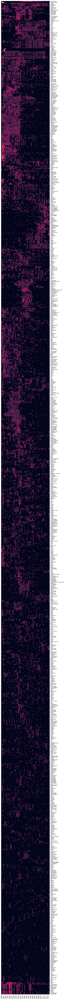

### Topic trajectories grouped into clusters

The heatmap contains a lot of topics but we see that we can group topics
into groups according to the similarity in their time evolution. We
perform this grouping quantitatively by employing `k-means clustering`.
Taking a matrix of presence/absence of topics in resolutions each year,
we perform k-means clustering for a range of number of clusters to find
the optimal number of clusters (elbow point). Then we perform k-means
clustering for the optimal number of clusters (32), we visualize the
time trajectories of each of these clusters and also show some of the
topics in each cluster.

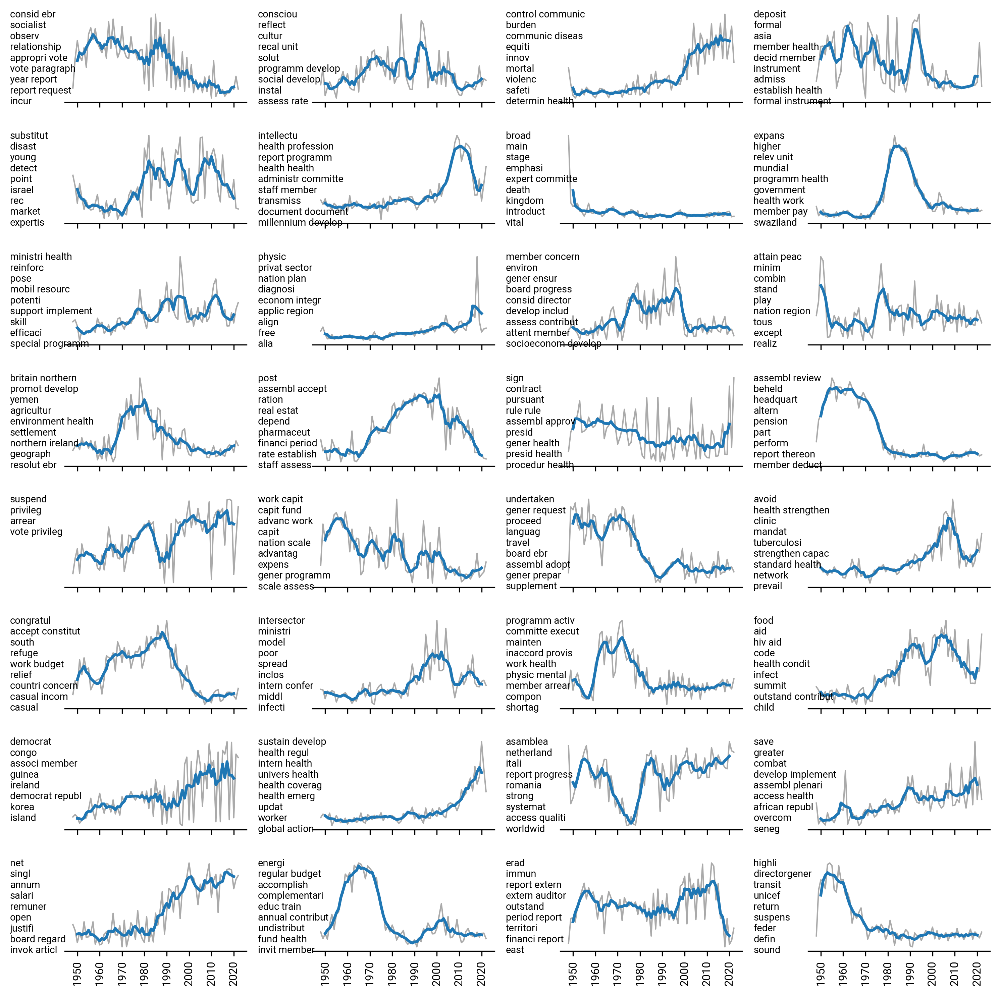

## Relationships among WHA resolutions

Next, to find relationships among WHA resolutions, we start from the
same TF-IDF based topics for each resolution. Then for each pair of
resolutions, we add an “edge” if they share a sufficient number of
topics. This way, we generate a network in which nodes are made up of
WHA resolutions and edges depict resolution pairs sharing common topics.

The set of parameters used to generate the topics and form the edges of
the network are crucial towards the characteristics of the network. For
example, the parameters we discussed before - minimum document
frequency, maximum document frequency, n-grams used, number of topics
per resolution - all matter. Fixing the minimum document frequency to 50
documents, maximum document frequency to 10%, using monograms and
bigrams, below we vary (a) the number of topics per resolution and (b)
minimum number of shared topics to form an edge, to generate a network
of WHA resolutions.

For each set of parameters, we use the Louvain method for community
detection on the resulting network, and calculate a set of metrics to
assess the quality of detected communities (partitions). For example,
`modularity` which is the value optimized in the Louvain’s method,
measures the density of links inside communities compared to links
between communities, is one such metric. A high modularity reflects a
good partitioning. However, a lot of nodes (resolutions) with no edges
with any other nodes, i.e. resolutions that are in their own partition
and aren’t associated with any other resolutions, will result in a high
modularity.

To correct for this, we also calculate other metrics - number of
partitions, number of non-isolated partitions (partitions with more than
one resolution in them), fraction of resolutions in non-isolated
partitions, and average number of resolutions per non-isolated
partition. Among these, fraction of resolutions in non-isolated
partitions is a metric that we would like to be high - a lot of
resolutions are grouped with one other resolution into some partition
this way. As one would expect, more topics per resolution increases this
metric, and more common topics to form an edge decreases this metric.

Modularity and the fraction of resolutions in non-isolated partitions
follow opposite trends. To balance these two forces, both of which we
want to be high, we define a `goodness score` of partitioning as their
product. We find that this goodness of partition is the highest (0.76)
when the number of topics per resolution is 5 and the minimum number of
common topics for an edge is 2.

Text(0.5, 210.1666666666666, 'Minimum topics for edge')

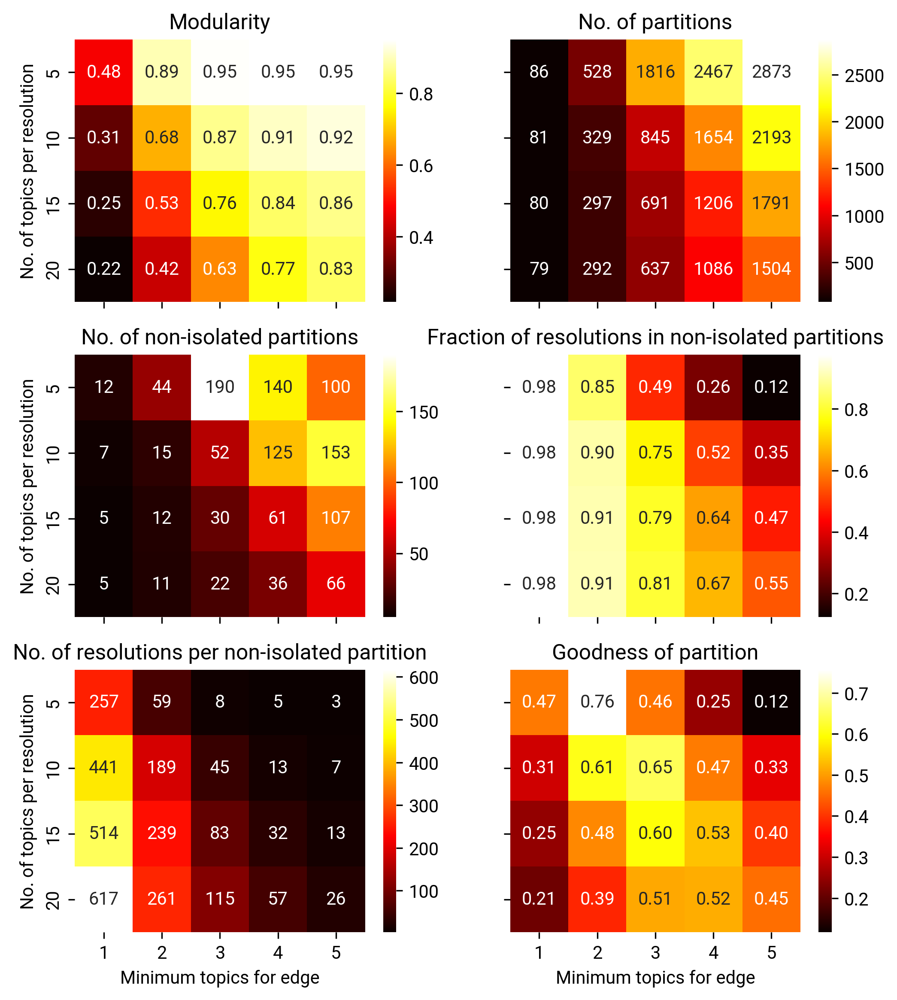

### Network of WHA resolutions

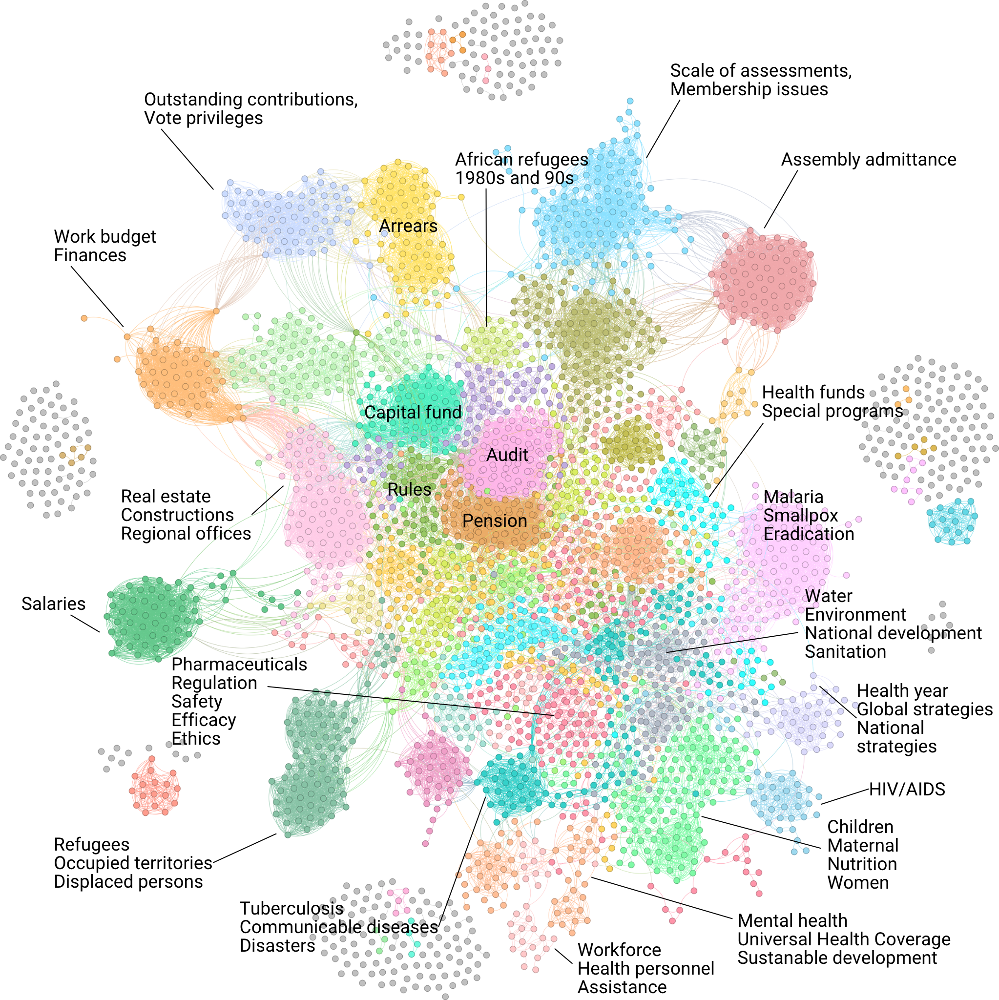

### Time evolution of topics found via WHA resolution network

From the Louvain partitions of the WHA resolution network, we find the
most frequent topics in the resolutions belonging to each partition and
assign them as the “partition topics”.

**Partition topics and their time evolution**

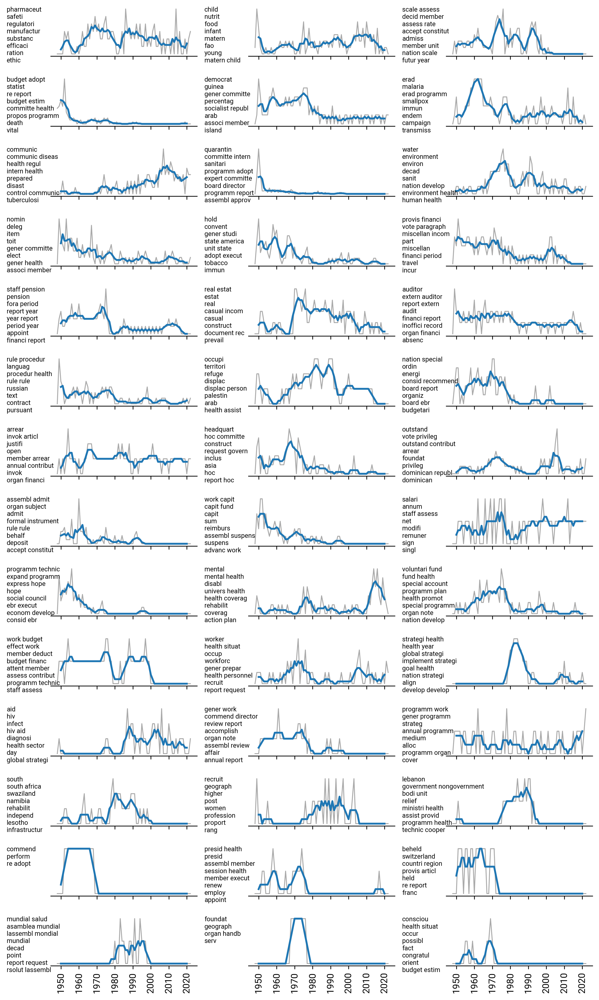

## Scale of assessments

I also extracted the scale of assessments every ten years, specifically
for the years 1962, 1972, 1982, 1992, 2002, 2012 and 2022. These denote
the percentage contributions to the WHO budget by each country. I
visualized these on a heatmap and clustered countries that have
contributed similarly over the years into groups.

There seem to 4-6 groups of countries according to their level of
contributions + changes in their contributions. The USA, China, Canada,
Italy, Japan, Germany, France and the UK have contributed most fractions
of the budget.

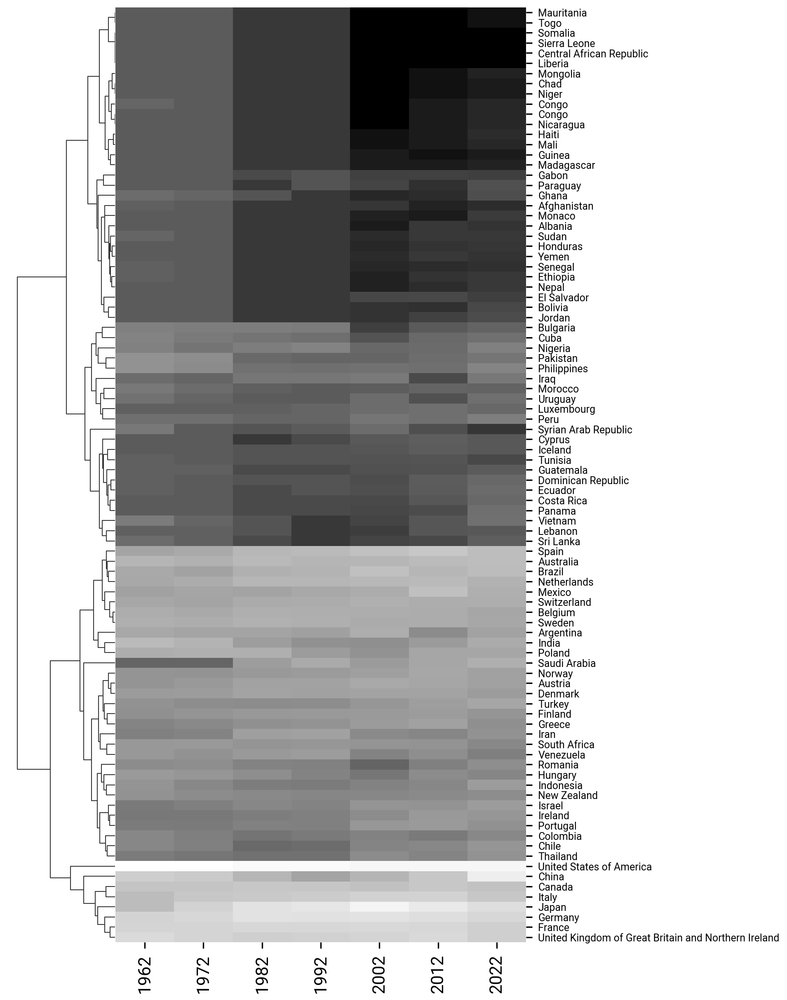

## Future directions

1.  Quantify WHA resolution network characteristics over years in n-year
    periods: understand evolution of network architecture.
2.  Compare and supplement usage of resolution titles to such above
    analysis.
3.  Analyze citation network of WHA resolutions.